In [2]:
import numpy as np
import pandas as pd
import pprint as pp

import matplotlib.pyplot as plt
%matplotlib inline

# to use seaborn styling in matplotlib plots
import seaborn as sns
sns.set()

# to display offline interactive plots
import plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

# cufflines binds plotly to pandas DFs
import cufflinks as cf
import plotly.tools as tls

tls.embed('https://plot.ly/~cufflinks/8')
cf.set_config_file(offline=True, world_readable=False, theme='ggplot')

# Helper Functions

In [3]:
# reshape original

def reshape_for_plot_old(df):
    #df = df.reset_index().copy()
    name = df.name.split('_')[0]
    df = df.set_index(['region', 'sub-region', 'country'])
    df = df.set_index(['country'])
    df = df.sort_index(level = 0)

    t = df.T
    t = t.unstack(level = 1)
    df = pd.DataFrame(t)
    
    df = df.reset_index()
    df = df.rename(columns={'level_1':'year', 0: name})
    
    # make sure year column is int type
    df['year'] = df['year'].astype('int64')
    df.name = name

    return df

In [4]:
#use chaining
def reshape_for_plot(df):
    name = df.name.split('_')[0]
    df = df.set_index(['region', 'sub-region', 'country']).sort_index(level = 0)
    #df = df.set_index(['country'])
    df = pd.DataFrame(df.T.unstack(level = 1))
    
    df = df.reset_index().rename(columns={'level_1':'year', 0: name})
    
    # make sure year column is int type
    df['year'] = df['year'].astype('int64')
    df.name = name

    return df


In [5]:
# pandas plotting

def reshape_for_pandas_faceting(df, region, value):
    
    # create multi-index and limit df to Europe
    df_region = df.reset_index().set_index(['region', 'sub_region', 'country']).loc[region]

    # transpose df & unstack years columns into single column
    df_region = pd.DataFrame(df_region.T.unstack()).reset_index().rename(columns={'level_2':'year', 0: value})

    return df_region

def pandas_subregion_plot(df, region, value):
    # subset df by region 
    df = df.loc[df['region']==region].copy()
    
    # create spaghetti plot of countries by sub_region
    for subreg in df['sub_region'].unique():
        df.loc[df['sub_region']==subreg].pivot('year', 'country', value).plot()
        plt.title(subreg + ' ' + value)
        
        # Put a legend to the right of the current axis
        plt.legend(loc='center left', bbox_to_anchor=(1,0.5))

# Load Data

In [116]:
mypath = 'data/final/'

filename = 'co2_2013.csv'
df = pd.read_csv(mypath + filename)
df.name = filename.split('_')[0]
df.head()

,region,sub-region,country,year,co2
0,Africa,Eastern Africa,Burundi,1751,NaN
1,Africa,Eastern Africa,Burundi,1752,NaN
2,Africa,Eastern Africa,Burundi,1753,NaN
3,Africa,Eastern Africa,Burundi,1754,NaN
4,Africa,Eastern Africa,Burundi,1755,NaN


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52863 entries, 0 to 52862
Data columns (total 5 columns):
region        52863 non-null object
sub-region    52863 non-null object
country       52863 non-null object
year          52863 non-null int64
co2           15494 non-null float64
dtypes: float64(1), int64(1), object(3)
memory usage: 2.0+ MB


# Explore data

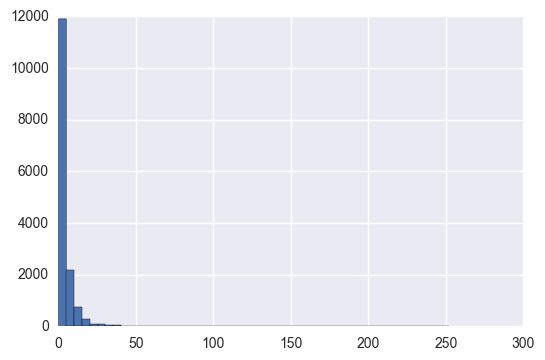

In [8]:
value = 'co2'
df[value].hist(bins=50); 

This is not very useful. Also, since CO2 data can go back to the 1700s, it's not all that relevant. Let's reduce the timeframe.

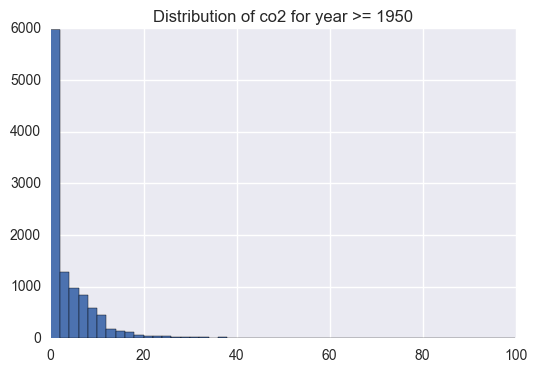

In [117]:
# CO2 dist since 1950

query = 'year >= 1950'

df.query(query)[value].hist(bins=50)
plt.title('Distribution of %s for %s' % (value, query)); 

Interestingly, the range of CO2 emissions has decreased. I suspect this is because coal is no longer a main fuel source. Something to dig into later.

## How does this distribution vary by region?

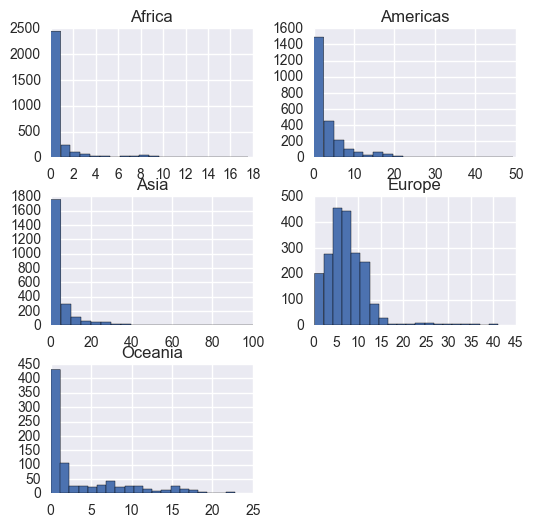

In [10]:
# dist by region

df.query(query).sort_values('region').set_index(['region', 'sub-region','country','year']).\
unstack(level=(0))[value].hist( figsize=(6,6), bins=20);

Europe has the only normal-ish distribution
Negative-skew data, except for Europe which is almost normal. Asia has an exceptionally long tail.

What about outliers?
I can barely make out the long tails in these histograms. Boxplots will highlight where there are outliers.

## How many outliers for each region?

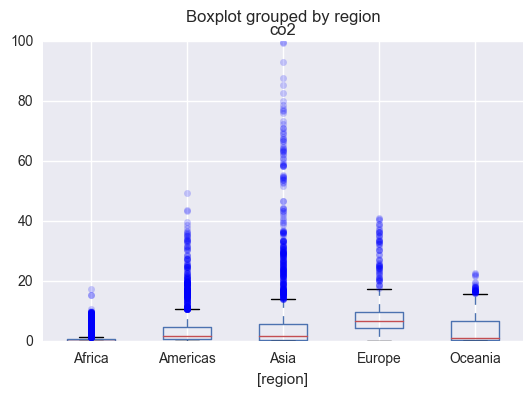

In [11]:
# set style for showing outliers
flierprops = dict(marker='o', markersize=5, alpha=0.2)

# reshape so region, sub_region & CO2 are columns
df_box = df.query(query).sort_values(['region', 'sub-region']).\
set_index(['region', 'sub-region','country','year'])[value].reset_index(level=(0,1))
                                                                        
df_box.boxplot(by='region', flierprops = flierprops);

#### Observations

*Asia has a lot of extreme outliers*

So which sub-regions are represented by these outliers? Are the outliers spread equally among sub-regions?

### Where are the outliers within each region?

In [12]:
# make boxplot subplots

# split reshaped into smaller regional df's
regions_dfs = [df_box.loc[df_box['region']==region] for region in df_box['region'].unique()]

def make_regional_boxplot(df):
    df.boxplot(by='sub-region', flierprops = flierprops, rot=45)
    plt.title(df['region'].unique())
    plt.show();

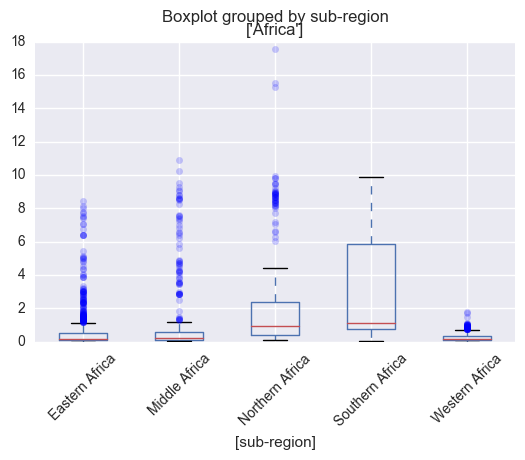

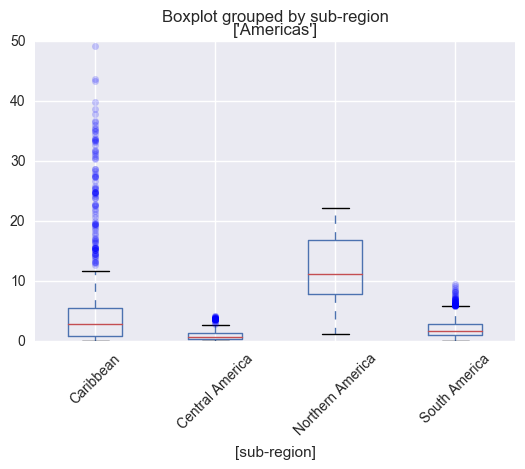

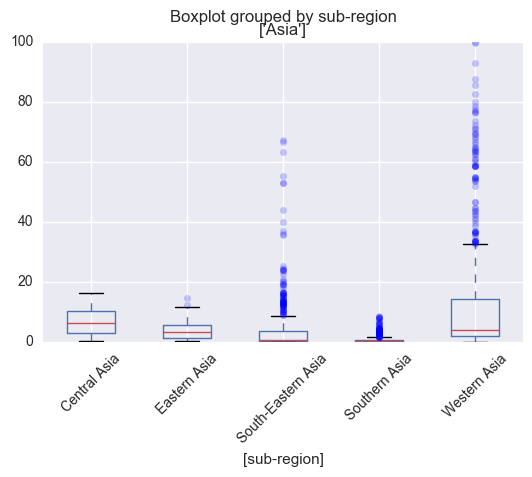

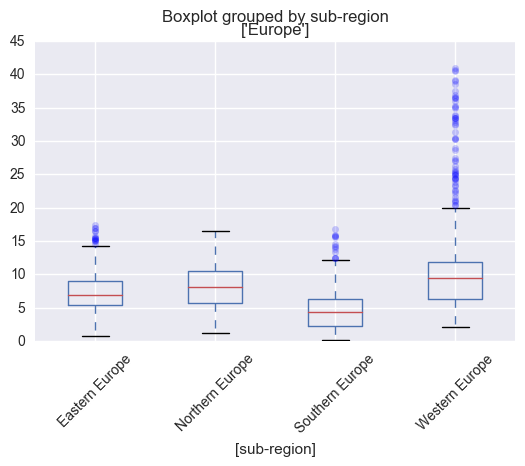

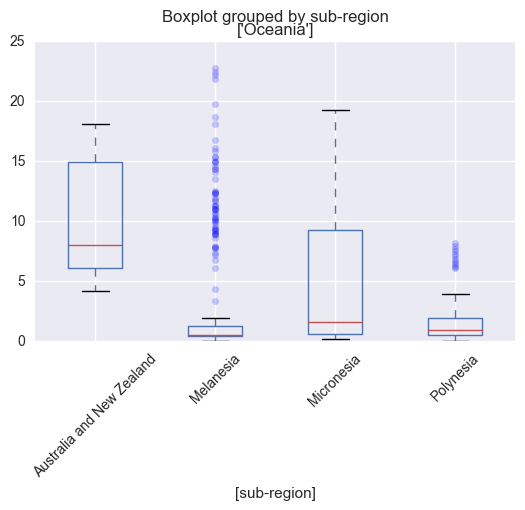

In [13]:
p = pd.Series(regions_dfs).apply(make_regional_boxplot)
p;

#### Observations
**Extreme outliers usually occur in one sub-region**

The most extreme outliers seem to be in Western Asia, probably from the oil-rich countries.

* In Europe, it's Western Europe.
* In the Americas, it's North America.
* In Oceania, it's Melanesia. Although what's an extreme outlier for Melanasia for the most part is just part of the IQR for Australia & New Zealand.

**Americas & Oceania *seem* to have the most variance amongst sub-regions**

But let's quantify that with some stats.

### Stats

In [63]:
df.query(query).groupby('region').describe()['co2']

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
Africa,3043.0,0.880661,1.848537,0.00000,0.092185,0.230040,0.648950,17.55229
Americas,2548.0,4.193962,5.928220,0.03153,0.815307,1.908275,4.740105,49.29365
Asia,2429.0,6.086236,11.814928,0.00000,0.384450,1.868070,5.898780,99.83136
Europe,2075.0,7.574353,5.166964,0.23512,4.580290,6.810160,9.818980,41.03192
Oceania,844.0,3.939933,5.102647,0.03220,0.480880,1.124600,6.675767,22.79775


Let's create some time-series plots so we can see how CO2 emissions have evolved over time.

## What does this look like over time?
### Pandas plotting

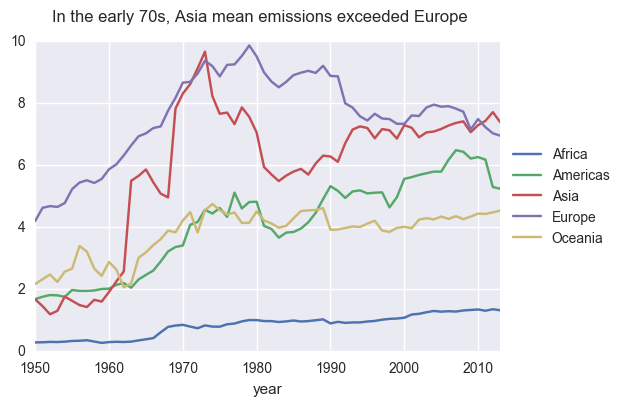

In [50]:
# mean CO2 by year & region
region_year = pd.DataFrame(df.query(query).groupby(['year', 'region']).mean())['co2']

# plot                           
region_year.unstack().plot()
plt.suptitle("In the early 70s, Asia mean emissions exceeded Europe")
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

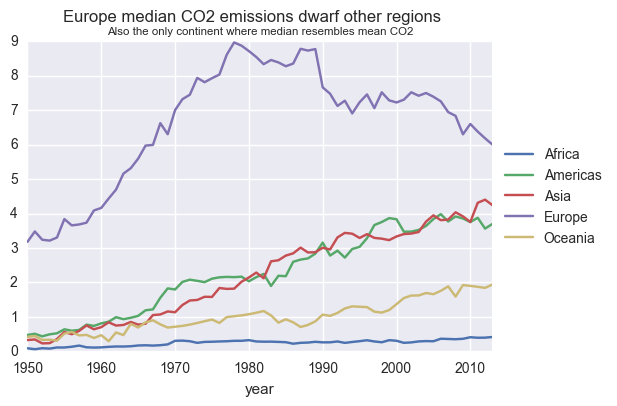

In [62]:
# median CO2 by year & region
region_year = pd.DataFrame(df.query(query).groupby(['year', 'region']).median())['co2']

# plot                           
region_year.unstack().plot()
plt.suptitle("Europe median CO2 emissions dwarf other regions", fontsize='medium', linespacing=10)
plt.title("Also the only continent where median resembles mean CO2", fontsize='x-small')
plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

In [143]:
reg_dfs = [gb[1] for gb in df.query(query).groupby('region')]

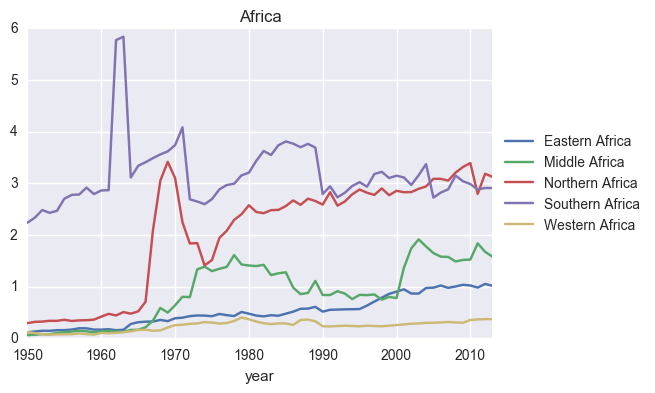

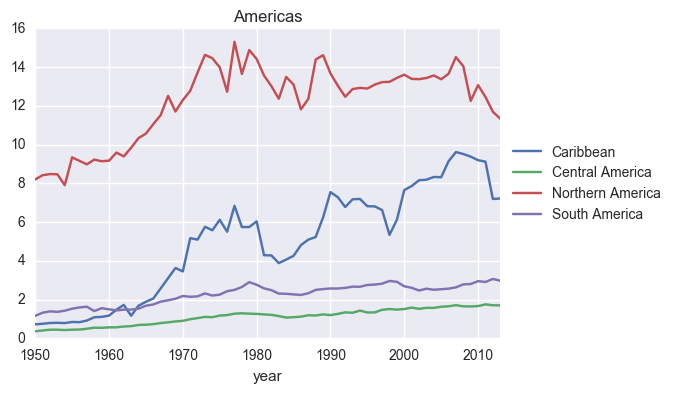

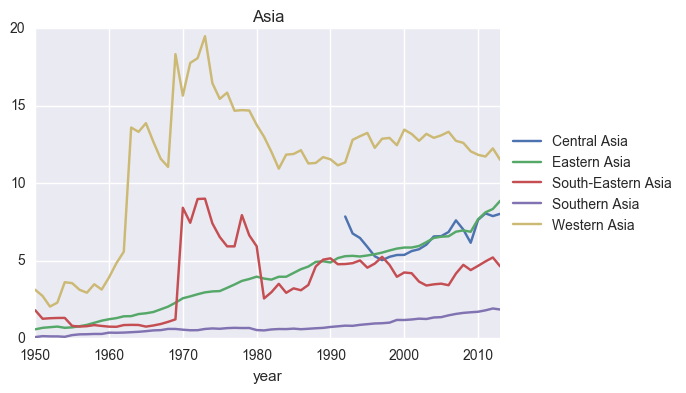

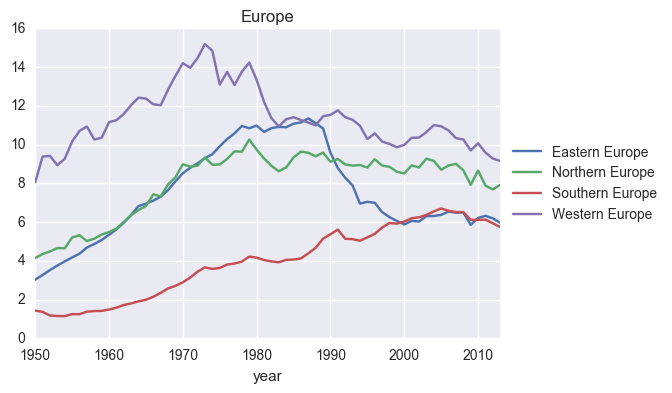

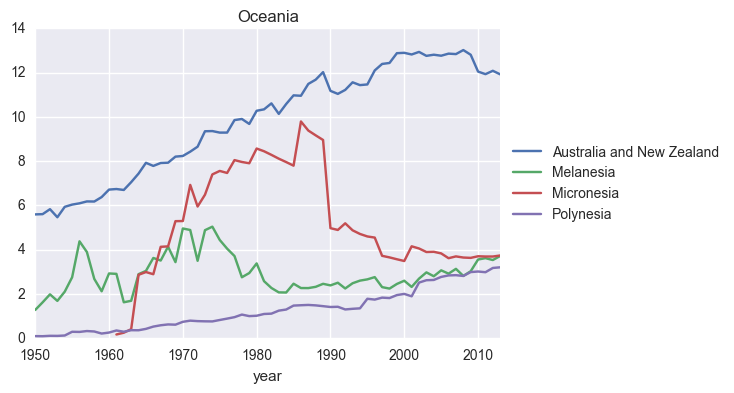

In [162]:
for reg in reg_dfs:
    reg_df = reg.groupby(['sub-region', 'year'])['co2'].mean().unstack(level=0)
    reg_df.plot();
    plt.title(reg['region'].unique()[0])
    plt.legend(loc='center left', bbox_to_anchor=(1,0.5));

In [ ]:
def reshape_for_pandas_faceting(df, region, value):
    
    # create multi-index and limit df to Europe
    df_region = df.reset_index().set_index(['region', 'sub-region', 'country']).loc[region]

    # transpose df & unstack years columns into single column
    df_region = pd.DataFrame(df_region.T.unstack()).reset_index().rename(columns={'level_2':'year', 0: value})

    return df_region

def pandas_subregion_plot(df, region, value):
    # subset df by region 
    df = df.loc[df['region']==region].copy()
    
    # create spaghetti plot of countries by sub_region
    for subreg in df['sub-region'].unique():
        df.loc[df['sub-region']==subreg].pivot('year', 'country', value).plot()
        plt.title(subreg + ' ' + value)
        
        # Put a legend to the right of the current axis
        plt.legend(loc='center left', bbox_to_anchor=(1,0.5))

In [ ]:
# plot data from 1950
region = 'Europe'
value = 'co2'
unit = 'metric tonnes'

pandas_subregion_plot(df.query(query), region, value)

### Observations

**What's with Luxembourg & Gibraltar?**
How can tiny countries known for financial services produce so much per capita CO2? Similarly, what's going on in the Faroe Islands, another tiny country that's a bit of an outlier for CO2 emissions.

**Lots of noise in the north & south, less so in East & West**

Even after faceting by sub_region, the N. & S. Europe plots are noisy. E. Europe, made up of entirely of former USSR states, all follow the same pattern and are likely a reflection of the interconnectedness of their economies. The implication: income/GDP should highly correlate with CO2. 

However, some ex-Soviet countries are included instead in either Northern or Southern Europe, which may account for the noisiness.

With the exception of major outlier Luxembourg, the Western European countries also appear to have parallel p.c. emissions. However, the line representing Luxembourg is just so much higher than the rest, it could just be muting the variations of the other countries.

To filter out certain countries, let's create interactive versions of the same plots using plotly.

### Plotly + cufflinks plotting

In [ ]:
def plotly_line(df, title):
    fig = df.iplot(asFigure = True,\
                    title = title,\
                    yTitle = str.title("Whatever"),\
                    theme = 'ggplot')
    return fig

def plotly_subreg_timeseries(df, subplot, value):
    for subreg in df[subplot].unique():
        subreg_df = df.loc[df[subplot]==subreg].pivot(index, column, value)
        #print subreg_df.head()
        fig = plotly_line(subreg_df, subreg + ' ' + value)
        py.offline.iplot(fig)

In [ ]:
# plot
query = "region=='Europe' & year >= 1950"
subplot = 'sub-region'
index = 'year'
column = 'country'
value = 'co2'

plotly_subreg_timeseries(df.query(query), subplot, value)

########## TO INTERACT WITH PLOT.LY PLOT #########
##### Hide a line: single-click corresponding legend item
##### Isolate a line: double-click legend item
##### Bring back all lines: double-click item a 2nd time
##### Select, zoom, pan: hover on upper right of plot to display toolbar

### Observations

In most of the sub-regions, the smallest countries tend to have highest avg CO2pc emissions:

* W. Europe: Luxembourg (outlier)
* S. Europe: Gibralter (outlier) and Andorra
* N. Europe: Faroe Islands, Estonia

The notable exception: Eastern Europe, where Russia tops the emissions values.

### Quantify with stats

In [ ]:
# descriptive stats
q = "year >= 1950 & region=='Europe'"
df.query(q).groupby('sub-region').describe()['co2']

## Put this in perspective

How does Europe on average compare with everywhere else?

In [ ]:
df.query(q).groupby('region').median()['co2'].sort_values()

Wow. 